In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import tensorflow_datasets as tfds

(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)



In [3]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


In [4]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

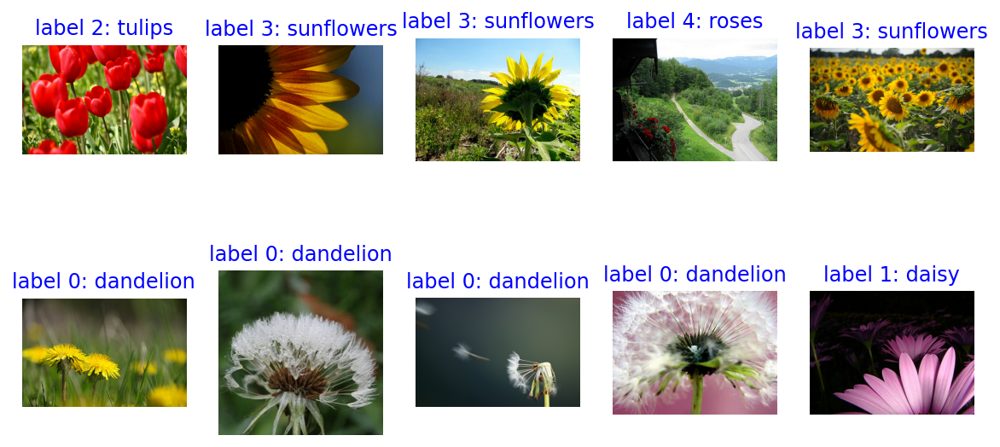

In [5]:
plt.figure(figsize=(10, 5)) # these images had been shuffeld by the publisher?


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}', color='blue')
    plt.axis('off')

In [6]:
print(metadata)
print(metadata.features['label'].names) # it has 5 classes. 0: Dandelion, 1: Daisy, 2: Tulips, 3: Sunflowers, 4: Roses

tfds.core.DatasetInfo(
    name='tf_flowers',
    version=3.0.1,
    description='A large set of images of flowers',
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=5),
    }),
    total_num_examples=3670,
    splits={
        'train': 3670,
    },
    supervised_keys=('image', 'label'),
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.tgz" }""",
    redistribution_info=,
)

['dandelion', 'daisy', 'tulips', 'sunflowers', 'roses']


In [7]:
import tensorflow as tf
IMG_SIZE = 160 # All images will be resized to 160x160. If I scale the images up, will the accuracy increase?

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # type casting
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE)) # How does this 'resizing' work?
    return image, label

In [8]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

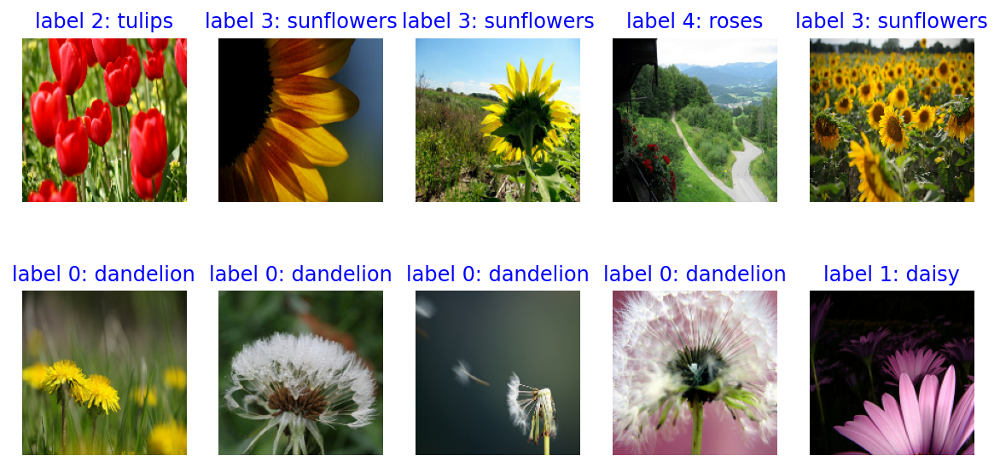

In [9]:
plt.figure(figsize=(10, 5)) 


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}', color='blue')
    plt.axis('off')

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [11]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

In [12]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [13]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [14]:
BATCH_SIZE = 32 # determining batch size which will be trained for one step.
SHUFFLE_BUFFER_SIZE = 1000 # shuffles the training data.

train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

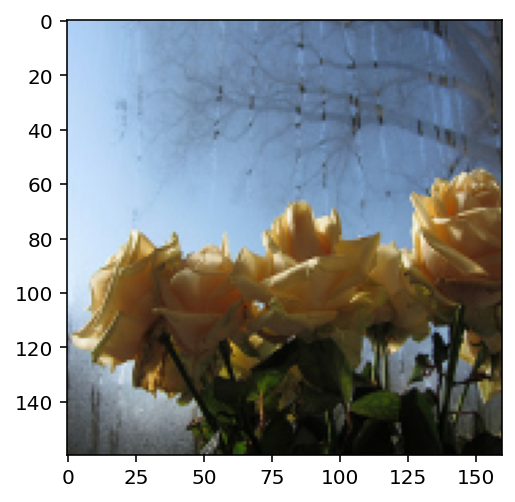

In [15]:
for image_batch, label_batch in train_batches.take(1):
    image_batch = (image_batch + 1) / 2
    plt.imshow(image_batch[0])
    pass

image_batch.shape, label_batch.shape


In [16]:
validation_steps = 12
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/12 [==============================] - 4s 361ms/step - loss: 1.6407 - accuracy: 0.2480
initial loss: 1.64
initial accuracy: 0.25


In [17]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 15s 168ms/step - loss: 1.3245 - accuracy: 0.4394 - val_loss: 1.1174 - val_accuracy: 0.5586
Epoch 2/10
92/92 [==============================] - 3s 30ms/step - loss: 1.0574 - accuracy: 0.5712 - val_loss: 1.0033 - val_accuracy: 0.6131
Epoch 3/10
92/92 [==============================] - 3s 29ms/step - loss: 0.9273 - accuracy: 0.6332 - val_loss: 0.9764 - val_accuracy: 0.5995
Epoch 4/10
92/92 [==============================] - 3s 30ms/step - loss: 0.8226 - accuracy: 0.6890 - val_loss: 1.0270 - val_accuracy: 0.6049
Epoch 5/10
92/92 [==============================] - 3s 30ms/step - loss: 0.7311 - accuracy: 0.7333 - val_loss: 0.9510 - val_accuracy: 0.5913
Epoch 6/10
92/92 [==============================] - 3s 30ms/step - loss: 0.6331 - accuracy: 0.7728 - val_loss: 0.9802 - val_accuracy: 0.6158
Epoch 7/10
92/92 [==============================] - 3s 30ms/step - loss: 0.5543 - accuracy: 0.8134 - val_loss: 0.9030 - val_accuracy: 0.6403
Epoch 8/10


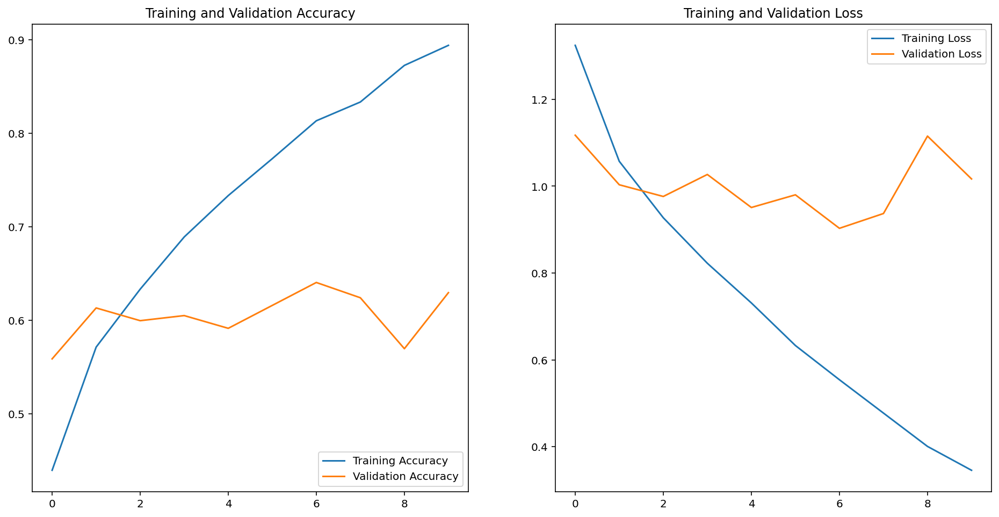

In [18]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [19]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[4.97091445e-04, 1.71675161e-03, 8.54415596e-01, 8.34173039e-02,
        5.99532425e-02],
       [8.12139869e-01, 1.83360770e-01, 3.23589286e-03, 3.21484367e-05,
        1.23125478e-03],
       [7.20891476e-01, 1.19720800e-02, 2.00181007e-01, 6.39744550e-02,
        2.98103550e-03],
       [2.14618128e-02, 3.74094769e-02, 7.96680868e-01, 2.89807515e-03,
        1.41549751e-01],
       [8.07091415e-01, 6.31159395e-02, 2.95372494e-02, 9.32620652e-03,
        9.09291953e-02],
       [2.42557392e-01, 2.56329447e-01, 3.98244321e-01, 5.32297827e-02,
        4.96389605e-02],
       [3.47298803e-04, 7.54205510e-03, 9.80382204e-01, 2.99332314e-03,
        8.73510540e-03],
       [2.94361673e-02, 1.12072289e-01, 5.57833910e-01, 2.09199399e-01,
        9.14582685e-02],
       [1.80060808e-02, 3.73459698e-05, 5.36669139e-03, 9.76090193e-01,
        4.99590591e-04],
       [9.79424238e-01, 1.86390039e-02, 3.78845900e-04, 2.23005809e-05,
        1.53552624e-03],
       [9.56640244e-01, 3.6002

In [20]:
import numpy as np
predictions = np.argmax(predictions, axis=1) # argmax returns indices of the max values along an axis.
predictions

array([2, 0, 0, 2, 0, 2, 2, 2, 3, 0, 0, 0, 3, 2, 2, 3, 2, 0, 1, 2, 2, 0,
       2, 0, 1, 0, 2, 2, 2, 1, 0, 0])

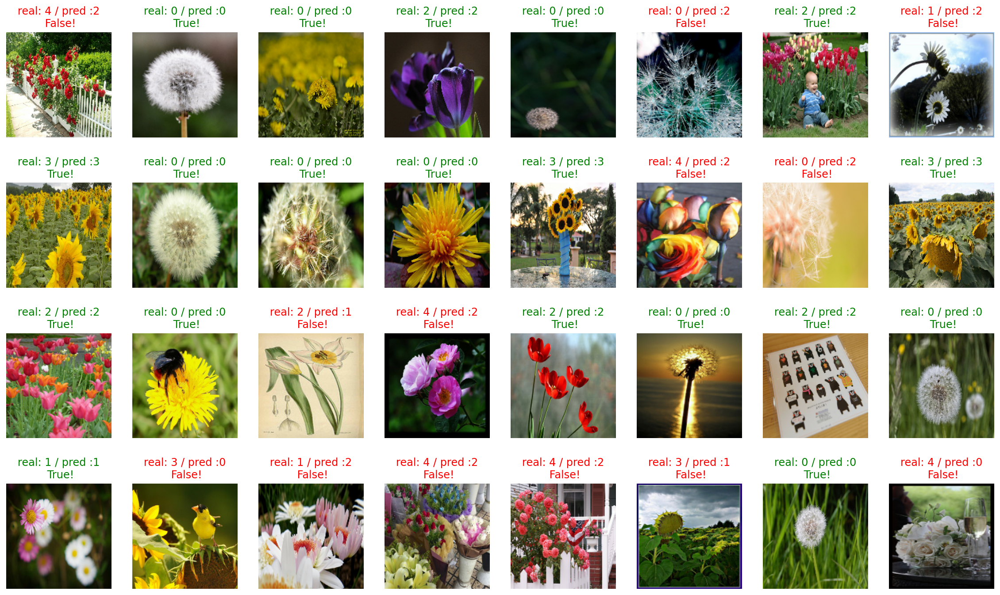

In [21]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'green'})
    plt.axis('off')

In [22]:
count = 0   
for image, label, prediction in zip(images, labels, predictions):
  if label == prediction:
    count += 1
  
print('The model predicts correctly with', count / 32 * 100, 'of probability')    # accuracy percentage

The model predicts correctly with 59.375 of probability


In [23]:
import os
img_dir_path = os.getenv("HOME") + "/workplace/Flower_image_classification"
os.path.exists(img_dir_path)

True

In [24]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

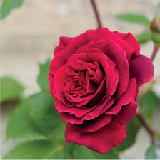

In [25]:
import os
checkpoint_dir = os.getenv("HOME") + "/workplace/Flower_image_classification"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

IMG_SIZE = 160
rose_image_path = os.path.join(img_dir_path, 'rose1.jpeg')

rose_image = load_img(rose_image_path, target_size=(IMG_SIZE, IMG_SIZE))
rose_image

In [26]:
rose_image = img_to_array(rose_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
rose_image.shape

(1, 160, 160, 3)

In [27]:
prediction = model.predict(rose_image)
prediction

array([[0., 0., 1., 0., 0.]], dtype=float32)

In [28]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    dandelion_percentage = round(prediction[0] * 100)
    daisy_percentage = round(prediction[1] * 100)
    tulip_percentage = round(prediction[2] * 100)
    sunflower_percentage = round(prediction[3] * 100)
    rose_percentage = round(prediction[4] * 100)
    print(f"This image seems \n {dandelion_percentage}% dandelion, {daisy_percentage}% daisy, {tulip_percentage}% tulip, {sunflower_percentage}% sunflower, {rose_percentage}% rose.")

This image seems 
 0.0% dandelion, 0.0% daisy, 100.0% tulip, 0.0% sunflower, 0.0% rose.


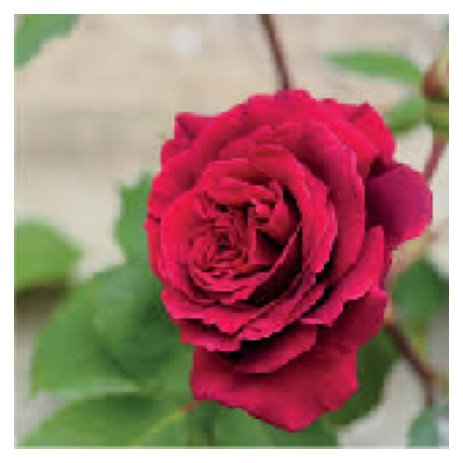

In [29]:
filename = 'rose1.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 
 0.0% dandelion, 100.0% daisy, 0.0% tulip, 0.0% sunflower, 0.0% rose.


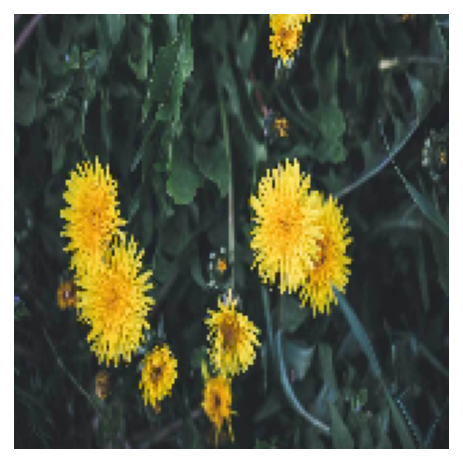

In [30]:
filename = 'dandelion1.jpg' # Using the function, any image can be predicted

show_and_predict_image(img_dir_path, filename)

In [31]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')
print(image_batch.shape) # batch of images
feature_batch = base_model(image_batch)
print(feature_batch.shape) # output batch

# Create a new classifier with global average pooling
global_average_layer = tf.keras.layers.GlobalAveragePooling2D() # (5, 5, 512) -> (1, 1, 512)
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape) 

dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(5, activation='softmax')

prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 160, 160, 3)
(32, 5, 5, 512)
(32, 512)
(32, 5)


In [32]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [33]:
base_model.trainable = False # base model (VGG16) is not set to be trained

VGG16_model = Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])
VGG16_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


In [41]:
base_learning_rate = 0.0001
VGG16_model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

validation_steps = 12
loss0, accuracy0 = VGG16_model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/12 [==============================] - 1s 68ms/step - loss: 0.6546 - accuracy: 0.7711
initial loss: 0.65
initial accuracy: 0.77


In [42]:
EPOCHS = 5 

history = VGG16_model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
92/92 [==============================] - 8s 91ms/step - loss: 0.6391 - accuracy: 0.7980 - val_loss: 0.6195 - val_accuracy: 0.7738
Epoch 2/5
92/92 [==============================] - 8s 90ms/step - loss: 0.6008 - accuracy: 0.8120 - val_loss: 0.5943 - val_accuracy: 0.7902
Epoch 3/5
92/92 [==============================] - 8s 92ms/step - loss: 0.5728 - accuracy: 0.8195 - val_loss: 0.5791 - val_accuracy: 0.7902
Epoch 4/5
92/92 [==============================] - 8s 91ms/step - loss: 0.5480 - accuracy: 0.8256 - val_loss: 0.5653 - val_accuracy: 0.7902
Epoch 5/5
92/92 [==============================] - 8s 92ms/step - loss: 0.5295 - accuracy: 0.8277 - val_loss: 0.5485 - val_accuracy: 0.8011


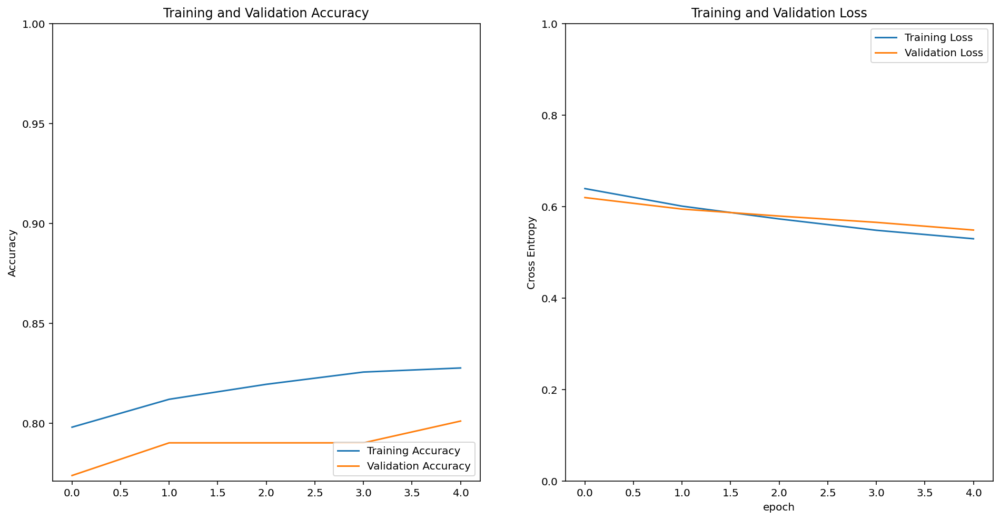

In [43]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [66]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = VGG16_model.predict(image_batch)
    pass

predictions

array([[2.38467064e-02, 6.38776645e-02, 7.31359839e-01, 7.98018277e-02,
        1.01113945e-01],
       [9.98037755e-01, 1.56612124e-03, 2.41830949e-05, 2.52197293e-04,
        1.19801181e-04],
       [7.63484836e-01, 1.05029047e-01, 2.22615693e-02, 8.98224339e-02,
        1.94021128e-02],
       [5.02263056e-03, 2.45993566e-02, 5.92498899e-01, 1.34258699e-02,
        3.64453256e-01],
       [6.66537166e-01, 2.73283988e-01, 1.55505352e-02, 1.85313765e-02,
        2.60969736e-02],
       [9.25673604e-01, 4.12103757e-02, 6.62652124e-03, 2.39704680e-02,
        2.51901452e-03],
       [1.53810205e-02, 1.67949274e-02, 7.01973736e-01, 1.85809642e-01,
        8.00406262e-02],
       [4.27565604e-01, 4.00057375e-01, 1.82889309e-03, 1.62537262e-01,
        8.01084749e-03],
       [1.86428241e-02, 3.37733631e-03, 3.51598710e-02, 8.64018619e-01,
        7.88013265e-02],
       [9.99128878e-01, 6.75017422e-04, 3.32780314e-06, 1.88091901e-04,
        4.74068156e-06],
       [9.74915326e-01, 1.7845

In [67]:
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 0, 2, 0, 3, 0, 0, 3, 3, 4, 0, 3, 2, 0, 2, 4, 2, 0,
       2, 0, 1, 3, 2, 4, 4, 3, 0, 4])

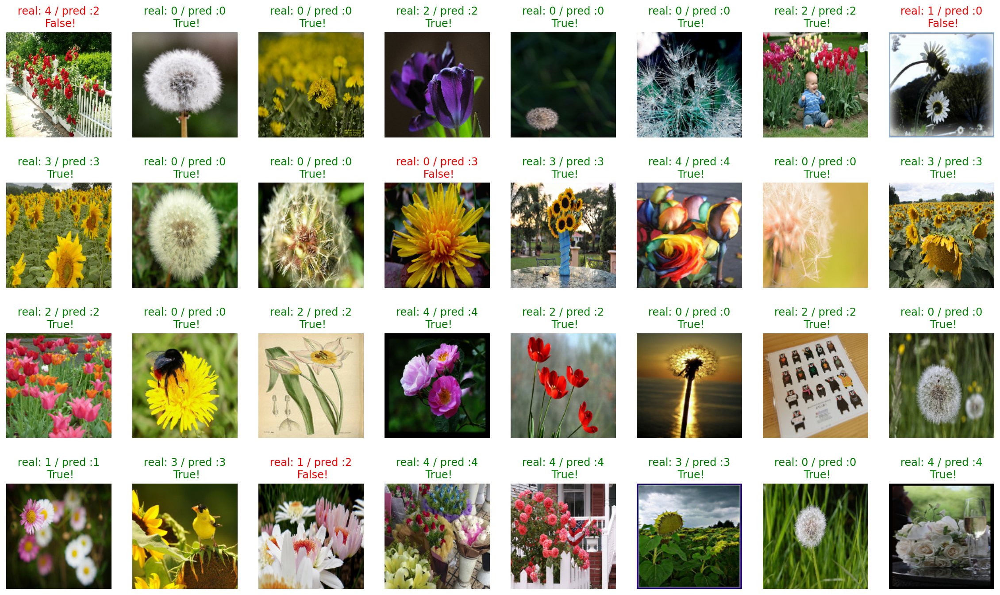

In [68]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'green'})
    plt.axis('off')

In [69]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 

87.5
